# Mini Project

## 1. Importing necessary packages

In [7]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import models, layers
from tensorflow.keras import optimizers

from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
import random
import cv2
import os
import PIL
from PIL import Image

from tensorflow.keras.layers import *
from tensorflow.keras.models import *
import tensorflow.keras
import tensorflow as tf

import mediapipe

from keras.utils.vis_utils import model_to_dot

import glob
import matplotlib.image as mpimg
%matplotlib inline

In [5]:
class_names = ['A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z']

## 2. Image preprocessing 

### 2.1 Applaying gaussian filter to the image demo

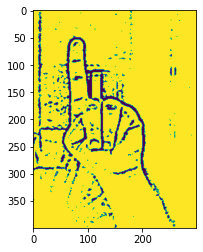

In [2]:
def func(path):    
    frame = cv2.imread(path)
    
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray,(5,5),2)

    th3 = cv2.adaptiveThreshold(blur,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY_INV,11,2)
    ret, res = cv2.threshold(th3, 70, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    return res

p ="demo image.jpg"

image = func(p)
plt.imshow(image)

### 2.2 : Applaying mediapipe framework

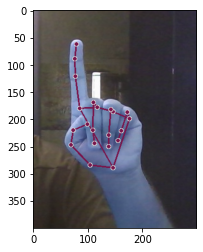

In [4]:
drawingModule = mediapipe.solutions.drawing_utils
handsModule = mediapipe.solutions.hands
 
with handsModule.Hands(static_image_mode=True) as hands:
 
    image = cv2.imread("demo image.jpg")
 
    results = hands.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
 
    if results.multi_hand_landmarks != None:
        for handLandmarks in results.multi_hand_landmarks:
            drawingModule.draw_landmarks(image, handLandmarks, handsModule.HAND_CONNECTIONS,
                                        drawingModule.DrawingSpec(color = (121,22,76), thickness = 2, circle_radius = 2),
                                        drawingModule.DrawingSpec(color = (121,22,76), thickness = 2, circle_radius = 2))
 
    #cv2.imshow('Test image', image)
    plt.imshow(image)
 
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# 3 : CNN Models

## 3.1 : CNN model for normal images

### 3.1.1 : Loading the necessary dataset

In [8]:
train_dir = r'data/train'  # Location of training images
validation_dir = r'data/valid' #Location of test images
test_dir =r'data/test' #Location of test images

### 3.1.2 : Sample dataset

<ipython-input-6-8af8719543c8>:11: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(len(images) / columns + 1, columns, i + 1)


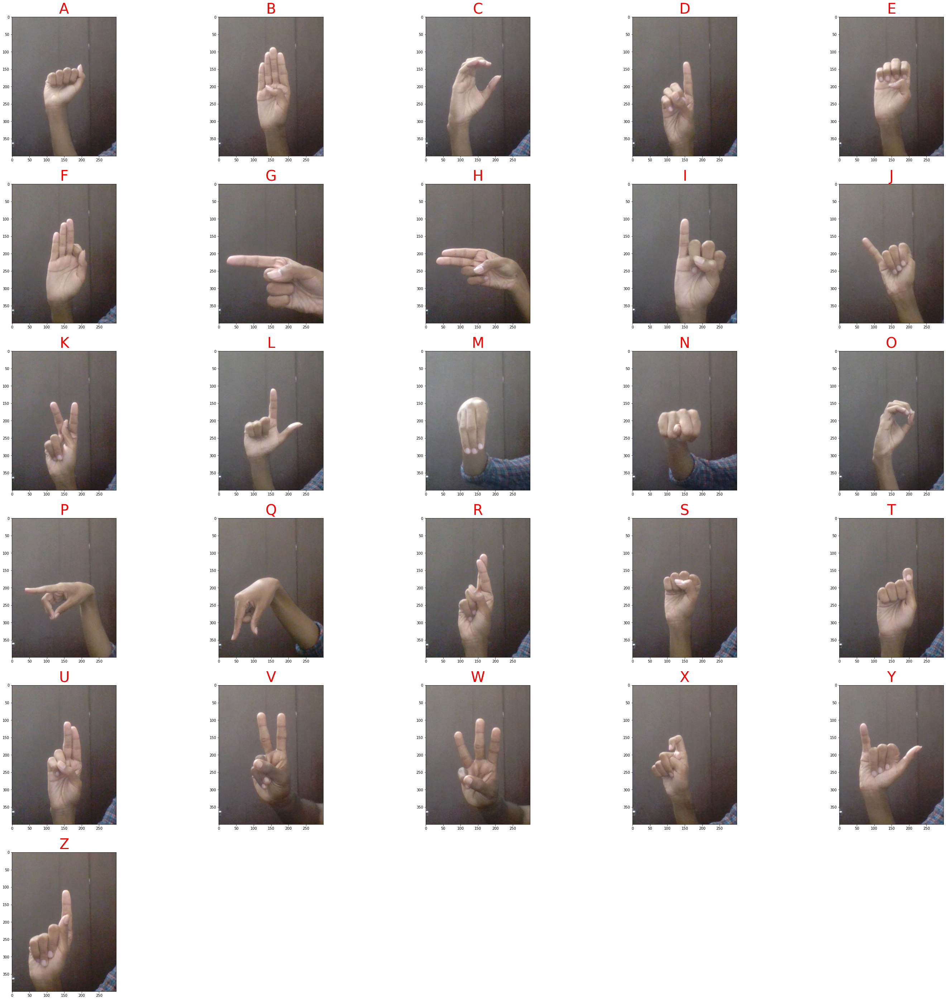

In [6]:
images = []
for img_path in glob.glob('images/*.jpg'):
    images.append(mpimg.imread(img_path))
    


plt.figure(figsize=(50,50))
columns = 5
for i, image in enumerate(images):
    #plt.text(60, 20,i,color='blue',fontsize=10,bbox=dict(facecolor='white',alpha=0.8))
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.title(class_names[i],fontsize=40,color="red")
    plt.imshow(image)

### 3.1.3 : CNN model 

In [9]:
# Generating batches of tensor image data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    )
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

val_generator = val_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 38706 images belonging to 26 classes.
Found 7886 images belonging to 26 classes.


In [10]:
model = models.Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(5,5), activation='relu', input_shape=(150, 150, 3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Dense(26, activation='softmax'))

In [11]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 146, 146, 32)      2432      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 73, 73, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 71, 71, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 35, 35, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 35, 35, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 78400)             0         
_________________________________________________________________
dense (Dense)                (None, 256)               2

In [12]:
from tensorflow.keras import optimizers
model.compile(
    loss='categorical_crossentropy', 
    optimizer='adam',
    metrics=['accuracy']  
)

### 3.1.3 : Training

In [13]:
history = model.fit(
      train_generator,
      steps_per_epoch=100, 
      epochs=20,
      validation_data=val_generator,
      validation_steps=66)  

Epoch 1/20
100/100 [==============================] - 52s 510ms/step - loss: 3.2429 - accuracy: 0.0995 - val_loss: 2.4735 - val_accuracy: 0.3765
Epoch 2/20
100/100 [==============================] - 51s 506ms/step - loss: 1.5479 - accuracy: 0.5830 - val_loss: 0.7203 - val_accuracy: 0.8106
Epoch 3/20
100/100 [==============================] - 43s 432ms/step - loss: 0.8547 - accuracy: 0.7720 - val_loss: 0.4982 - val_accuracy: 0.8705
Epoch 4/20
100/100 [==============================] - 39s 385ms/step - loss: 0.5586 - accuracy: 0.8375 - val_loss: 0.3443 - val_accuracy: 0.9053
Epoch 5/20
100/100 [==============================] - 37s 367ms/step - loss: 0.4925 - accuracy: 0.8590 - val_loss: 0.3352 - val_accuracy: 0.9068
Epoch 6/20
100/100 [==============================] - 38s 375ms/step - loss: 0.4065 - accuracy: 0.8855 - val_loss: 0.2886 - val_accuracy: 0.9235
Epoch 7/20
100/100 [==============================] - 37s 366ms/step - loss: 0.3813 - accuracy: 0.8895 - val_loss: 0.2704 - val_ac

### 3.1.4 : Model performance graph

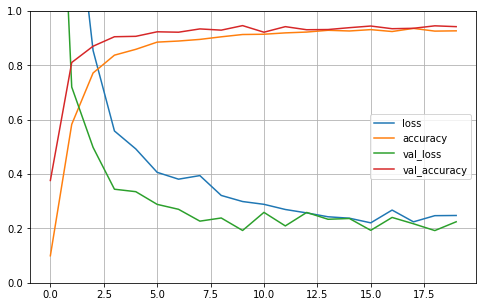

In [14]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### 3.1.5 : Saving the model

In [15]:
model.save("model_main.h5") 

### 3.1.6 : Loading the saved model

In [16]:
model_main = tf.keras.models.load_model('model_main.h5')

### 3.1.7 : Testing the model

In [17]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 7888 images belonging to 26 classes.


In [18]:
model_main.evaluate(test_generator, steps=9)

9/9 [==============================] - 1s 105ms/step - loss: 0.1808 - accuracy: 0.9556


[0.18080957233905792, 0.9555555582046509]

## 3.2 : CNN model with gaussian filter

### 3.2.1 : Loading the necessary dataset

In [20]:
train_dir = r'data/train'  # Location of training images
validation_dir = r'data/valid' #Location of test images
test_dir =r'data/test' #Location of test images

### 3.2.2 : Sample dataset

<ipython-input-19-8af8719543c8>:11: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(len(images) / columns + 1, columns, i + 1)


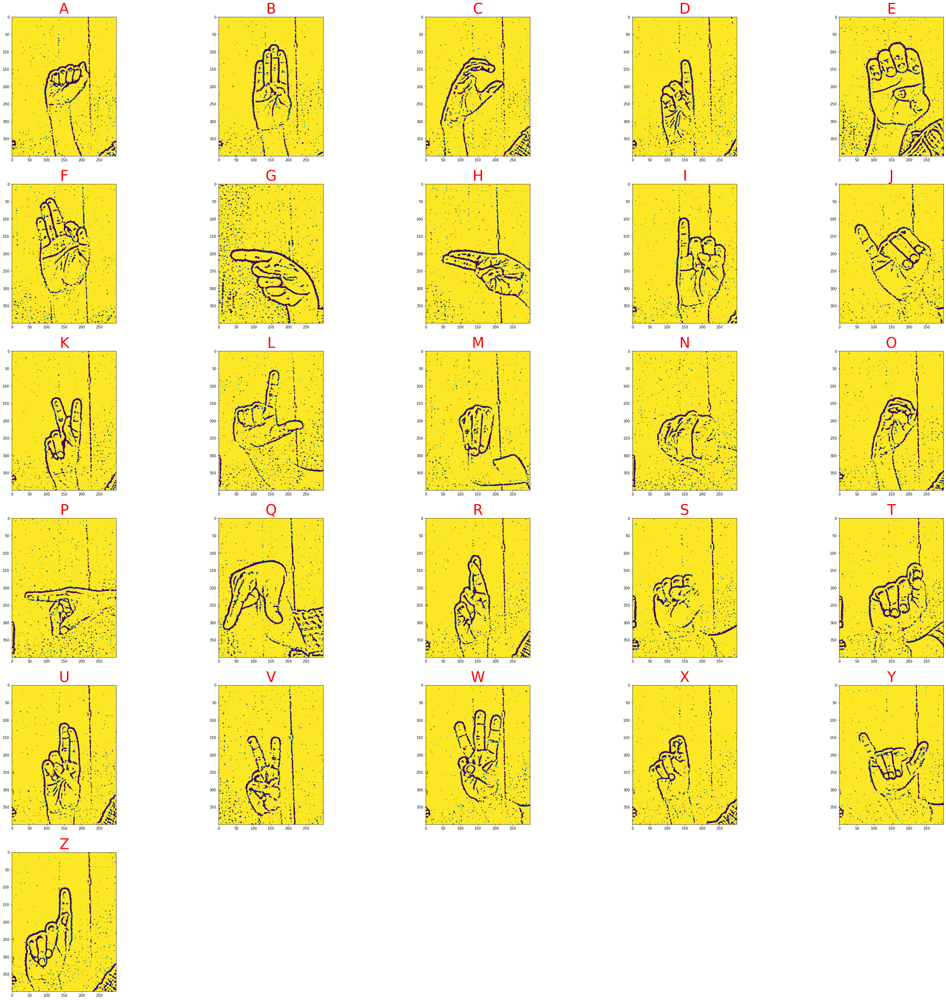

In [19]:
images = []
for img_path in glob.glob('images/*.jpg'):
    images.append(mpimg.imread(img_path))
    


plt.figure(figsize=(50,50))
columns = 5
for i, image in enumerate(images):
    #plt.text(60, 20,i,color='blue',fontsize=10,bbox=dict(facecolor='white',alpha=0.8))
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.title(class_names[i],fontsize=40,color="red")
    plt.imshow(image)

### 3.2.3 : CNN model 

In [21]:
# Generating batches of tensor image data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    )
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

val_generator = val_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 38238 images belonging to 26 classes.
Found 7782 images belonging to 26 classes.


In [22]:

model = models.Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(5,5), activation='relu', input_shape=(150, 150, 3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Dense(26, activation='softmax'))

In [23]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 146, 146, 32)      2432      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 73, 73, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 71, 71, 64)        18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 35, 35, 64)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 35, 35, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 78400)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)              

In [24]:
from tensorflow.keras import optimizers
model.compile(
    loss='categorical_crossentropy', 
    optimizer='adam',
    metrics=['accuracy']  
)

### 3.2.4 : Training

In [25]:
history = model.fit(
      train_generator,
      steps_per_epoch=100, 
      epochs=20,
      validation_data=val_generator,
      validation_steps=66)  

Epoch 1/20
100/100 [==============================] - 33s 324ms/step - loss: 2.9064 - accuracy: 0.2510 - val_loss: 1.0232 - val_accuracy: 0.7129
Epoch 2/20
100/100 [==============================] - 34s 341ms/step - loss: 0.8565 - accuracy: 0.7420 - val_loss: 0.3819 - val_accuracy: 0.8970
Epoch 3/20
100/100 [==============================] - 40s 399ms/step - loss: 0.4665 - accuracy: 0.8620 - val_loss: 0.2352 - val_accuracy: 0.9470
Epoch 4/20
100/100 [==============================] - 40s 402ms/step - loss: 0.3410 - accuracy: 0.9035 - val_loss: 0.2138 - val_accuracy: 0.9386
Epoch 5/20
100/100 [==============================] - 39s 391ms/step - loss: 0.2755 - accuracy: 0.9205 - val_loss: 0.1815 - val_accuracy: 0.9477
Epoch 6/20
100/100 [==============================] - 39s 392ms/step - loss: 0.2286 - accuracy: 0.9335 - val_loss: 0.1947 - val_accuracy: 0.9447
Epoch 7/20
100/100 [==============================] - 38s 381ms/step - loss: 0.2209 - accuracy: 0.9410 - val_loss: 0.1498 - val_ac

### 3.2.5 : Model performance graph

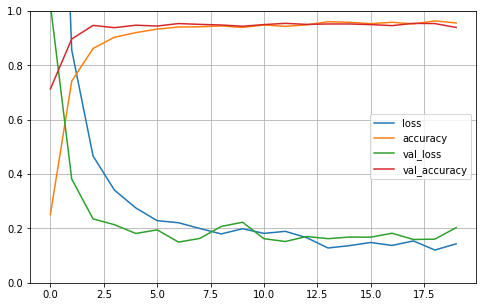

In [26]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### 3.2.6 : Saving the model

In [27]:
model.save("model_gausian.h5") 

### 3.2.7 : Loading the saved model

In [28]:
model_gausian = tf.keras.models.load_model('model_gausian.h5')

### 3.2.8 : Testing the model

In [29]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 7784 images belonging to 26 classes.


In [30]:
model_gausian.evaluate(test_generator, steps=9)

9/9 [==============================] - 2s 174ms/step - loss: 0.0552 - accuracy: 0.9833


[0.05518955737352371, 0.9833333492279053]

## 3.3 : CNN model with mediapipe

### 3.3.1 : Loading the necessary dataset

In [31]:
train_dir = r'data/train'  # Location of training images
validation_dir = r'data/valid' #Location of test images
test_dir =r'data/test' #Location of test images

### 3.3.2 : Sample dataset

<ipython-input-46-8af8719543c8>:11: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(len(images) / columns + 1, columns, i + 1)


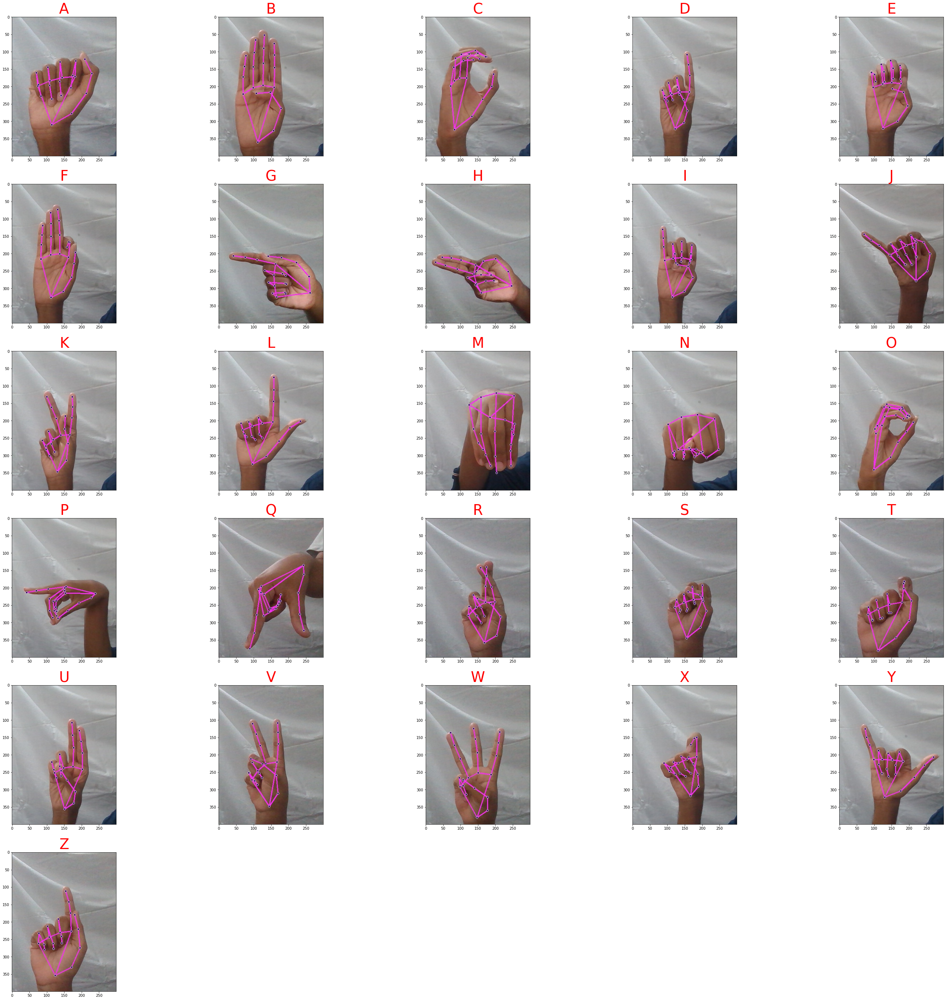

In [46]:
images = []
for img_path in glob.glob('images/*.jpg'):
    images.append(mpimg.imread(img_path))
    


plt.figure(figsize=(50,50))
columns = 5
for i, image in enumerate(images):
    #plt.text(60, 20,i,color='blue',fontsize=10,bbox=dict(facecolor='white',alpha=0.8))
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.title(class_names[i],fontsize=40,color="red")
    plt.imshow(image)

### 3.3.3 : CNN model 

In [33]:
# Generating batches of tensor image data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    )
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

val_generator = val_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 47932 images belonging to 26 classes.
Found 9645 images belonging to 26 classes.


In [34]:
model = models.Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(5,5), activation='relu', input_shape=(150, 150, 3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Dense(26, activation='softmax'))

In [35]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 146, 146, 32)      2432      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 73, 73, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 71, 71, 64)        18496     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 35, 35, 64)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 35, 35, 64)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 78400)             0         
_________________________________________________________________
dense_4 (Dense)              (None, 256)              

In [36]:
from tensorflow.keras import optimizers
model.compile(
    loss='categorical_crossentropy', 
    optimizer='adam',
    metrics=['accuracy']  
)

### 3.3.4 : Training

In [37]:
history = model.fit(
      train_generator,
      steps_per_epoch=100, 
      epochs=20,
      validation_data=val_generator,
      validation_steps=66) 

Epoch 1/20
100/100 [==============================] - 69s 688ms/step - loss: 3.2293 - accuracy: 0.1135 - val_loss: 2.2778 - val_accuracy: 0.3492
Epoch 2/20
100/100 [==============================] - 67s 670ms/step - loss: 1.7169 - accuracy: 0.5276 - val_loss: 0.7545 - val_accuracy: 0.8189
Epoch 3/20
100/100 [==============================] - 74s 745ms/step - loss: 0.8056 - accuracy: 0.7730 - val_loss: 0.3430 - val_accuracy: 0.9053
Epoch 4/20
100/100 [==============================] - 52s 524ms/step - loss: 0.4886 - accuracy: 0.8585 - val_loss: 0.1913 - val_accuracy: 0.9561
Epoch 5/20
100/100 [==============================] - 40s 398ms/step - loss: 0.3397 - accuracy: 0.9070 - val_loss: 0.1545 - val_accuracy: 0.9636
Epoch 6/20
100/100 [==============================] - 35s 350ms/step - loss: 0.2396 - accuracy: 0.9345 - val_loss: 0.1305 - val_accuracy: 0.9712
Epoch 7/20
100/100 [==============================] - 33s 334ms/step - loss: 0.2640 - accuracy: 0.9255 - val_loss: 0.1336 - val_ac

### 3.3.5 : Model performance graph

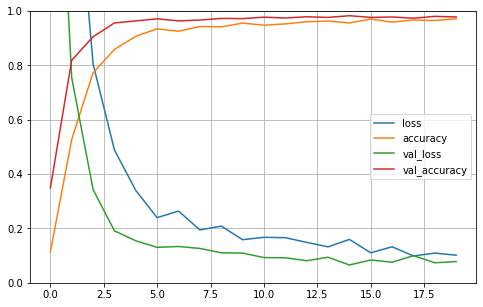

In [39]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### 3.3.6 : Saving the model

In [40]:
model.save("model_sk.h5") 

### 3.3.7 : Loading the saved model

In [41]:
model_sk = tf.keras.models.load_model('model_sk.h5')

### 3.2.8 : Testing the model

In [83]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 1109 images belonging to 3 classes.


In [43]:
model_sk.evaluate(test_generator, steps=9)

9/9 [==============================] - 1s 121ms/step - loss: 0.1266 - accuracy: 0.9722


[0.12658905982971191, 0.9722222089767456]

## 4 : Initial observation

In [45]:
performance = [["Normal Image",92.70,94.24,95.56],["Gaussian Filter",95.60,93.94,98.33],["Mediapipe",97.15,97.80,97.22]]
df = pd.DataFrame(performance, columns = ['Model', 'Training Accuracy','Validation Accuracy','Test Accuracy'])
df

,Model,Training Accuracy,Validation Accuracy,Test Accuracy
0,Normal Image,92.70,94.24,95.56
1,Gaussian Filter,95.60,93.94,98.33
2,Mediapipe,97.15,97.80,97.22


***During the initial observations we find that, some of the letters are more miss classified like:***

***1.	For D : R and U***

***2.	For U : D and R***

***3.	For I : T, D, K and I***

***4.	For S : M and N***

***So to handle this case we made three different classifiers for classifying these sets:***

***1.	{D,R,U}***

***2.	{T,K,D,I}***

***3.	{S,M,N}***


## 5: Sub Models

### 5.1 : {D, R, U}

### 5.1.1 : Loading the necessary dataset

In [51]:
train_dir = r'data/train'  # Location of training images
validation_dir = r'data/valid' #Location of test images
test_dir =r'data/test' #Location of test images

### 5.1.2 : Sample dataset

<ipython-input-47-55fea9408f83>:11: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(len(images) / columns + 1, columns, i + 1)


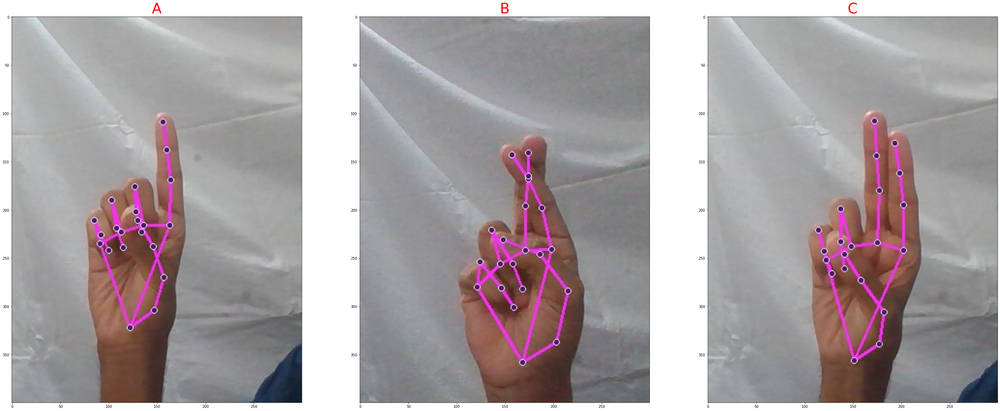

In [47]:
images = []
for img_path in glob.glob('images/*.jpg'):
    images.append(mpimg.imread(img_path))
    


plt.figure(figsize=(50,50))
columns = 3
for i, image in enumerate(images):
    #plt.text(60, 20,i,color='blue',fontsize=10,bbox=dict(facecolor='white',alpha=0.8))
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.title(class_names[i],fontsize=40,color="red")
    plt.imshow(image)

### 5.1.3 : CNN model 

In [52]:
# Generating batches of tensor image data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    )
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

val_generator = val_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 5515 images belonging to 3 classes.
Found 1110 images belonging to 3 classes.


In [53]:
model = models.Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(5,5), activation='relu', input_shape=(150, 150, 3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Dense(3, activation='softmax'))

In [54]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 146, 146, 32)      2432      
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 73, 73, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 71, 71, 64)        18496     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 35, 35, 64)        0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 35, 35, 64)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 78400)             0         
_________________________________________________________________
dense_6 (Dense)              (None, 256)              

### 5.1.4 : Training

In [56]:
from tensorflow.keras import optimizers
model.compile(
    loss='categorical_crossentropy', 
    optimizer='adam',
    metrics=['accuracy']  
)

history = model.fit(
      train_generator,
      steps_per_epoch=50, 
      epochs=5,
      validation_data=val_generator,
      validation_steps=33)  

Epoch 1/5
50/50 [==============================] - 17s 323ms/step - loss: 1.1248 - accuracy: 0.5437 - val_loss: 0.5383 - val_accuracy: 0.7348
Epoch 2/5
50/50 [==============================] - 15s 299ms/step - loss: 0.2591 - accuracy: 0.9180 - val_loss: 0.0573 - val_accuracy: 0.9848
Epoch 3/5
50/50 [==============================] - 14s 287ms/step - loss: 0.0873 - accuracy: 0.9740 - val_loss: 0.0438 - val_accuracy: 0.9864
Epoch 4/5
50/50 [==============================] - 14s 283ms/step - loss: 0.0531 - accuracy: 0.9820 - val_loss: 0.0570 - val_accuracy: 0.9818
Epoch 5/5
50/50 [==============================] - 14s 281ms/step - loss: 0.0299 - accuracy: 0.9890 - val_loss: 0.0353 - val_accuracy: 0.9879


### 5.1.5 : Model performance graph

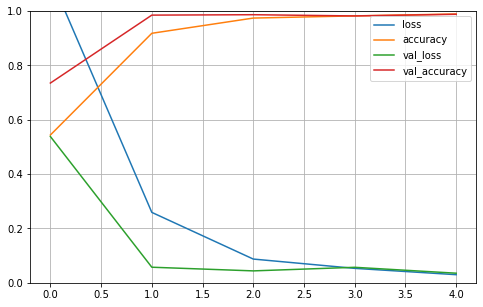

In [57]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### 5.1.6 : Saving the model

In [58]:
model.save("model_dru.h5") 

### 5.1.7 : Loading the saved model

In [59]:
model_dru = tf.keras.models.load_model("model_dru.h5")

### 5.1.8 : Testing the model

In [60]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 1110 images belonging to 3 classes.


In [61]:
model_dru.evaluate(test_generator, steps=9)

9/9 [==============================] - 1s 113ms/step - loss: 0.0058 - accuracy: 1.0000


[0.005786491092294455, 1.0]

## 5.2 : {T, K, D, I}

### 5.2.1 : Loading the necessary dataset

In [62]:
train_dir = r'data/train'  # Location of training images
validation_dir = r'data/valid' #Location of test images
test_dir =r'data/test' #Location of test images

### 5.2.2 : Sample dataset

<ipython-input-48-30602f757213>:11: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(len(images) / columns + 1, columns, i + 1)


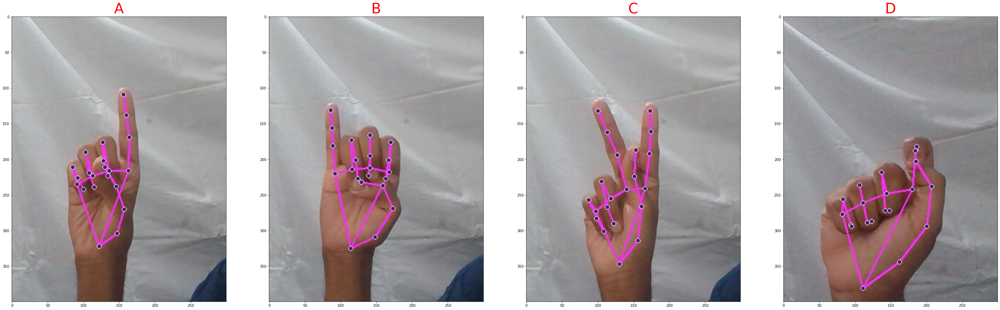

In [48]:
images = []
for img_path in glob.glob('images/*.jpg'):
    images.append(mpimg.imread(img_path))
    


plt.figure(figsize=(50,50))
columns = 4
for i, image in enumerate(images):
    #plt.text(60, 20,i,color='blue',fontsize=10,bbox=dict(facecolor='white',alpha=0.8))
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.title(class_names[i],fontsize=40,color="red")
    plt.imshow(image)

### 5.2.3 : CNN model 

In [63]:
# Generating batches of tensor image data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    )
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

val_generator = val_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 7374 images belonging to 4 classes.
Found 1483 images belonging to 4 classes.


In [64]:
model = models.Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(5,5), activation='relu', input_shape=(150, 150, 3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Dense(4, activation='softmax'))

In [65]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 146, 146, 32)      2432      
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 73, 73, 32)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 71, 71, 64)        18496     
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 35, 35, 64)        0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 35, 35, 64)        0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 78400)             0         
_________________________________________________________________
dense_8 (Dense)              (None, 256)              

In [66]:
from tensorflow.keras import optimizers
model.compile(
    loss='categorical_crossentropy', 
    optimizer='adam',
    metrics=['accuracy']  
)

### 5.2.4 : Training

In [67]:
history = model.fit(
      train_generator,
      steps_per_epoch=50, 
      epochs=5,
      validation_data=val_generator,
      validation_steps=33)  

Epoch 1/5
50/50 [==============================] - 19s 362ms/step - loss: 1.2914 - accuracy: 0.5760 - val_loss: 0.2291 - val_accuracy: 0.9470
Epoch 2/5
50/50 [==============================] - 17s 334ms/step - loss: 0.2146 - accuracy: 0.9225 - val_loss: 0.0971 - val_accuracy: 0.9576
Epoch 3/5
50/50 [==============================] - 16s 317ms/step - loss: 0.0891 - accuracy: 0.9730 - val_loss: 0.0522 - val_accuracy: 0.9818
Epoch 4/5
50/50 [==============================] - 15s 296ms/step - loss: 0.0675 - accuracy: 0.9770 - val_loss: 0.0590 - val_accuracy: 0.9773
Epoch 5/5
50/50 [==============================] - 15s 303ms/step - loss: 0.0898 - accuracy: 0.9750 - val_loss: 0.0543 - val_accuracy: 0.9788


### 5.2.5 : Model performance graph

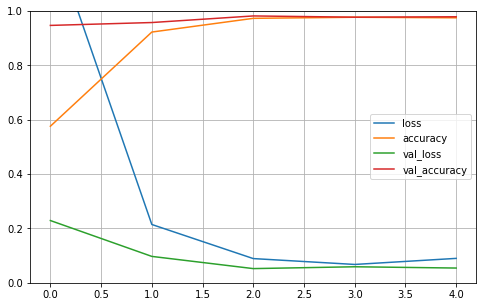

In [68]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### 5.2.6 : Saving the model

In [69]:
model.save("model_tkdi.h5") 

### 5.2.7 : Loading the saved model

In [70]:
model_tkdi = tf.keras.models.load_model("model_tkdi.h5")

### 5.2.8 : Testing the model

In [71]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 1483 images belonging to 4 classes.


In [72]:
model_tkdi.evaluate(test_generator, steps=9)

9/9 [==============================] - 1s 113ms/step - loss: 0.0061 - accuracy: 1.0000


[0.006108362227678299, 1.0]

## 5.3 : {S, M, N}

### 5.3.1 : Loading the necessary dataset

In [73]:
train_dir = r'data/train'  # Location of training images
validation_dir = r'data/valid' #Location of test images
test_dir =r'data/test' #Location of test images

### 5.3.2 : Sample dataset

<ipython-input-50-06661cfe04d2>:11: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  plt.subplot(len(images) / columns + 1, columns, i + 1)


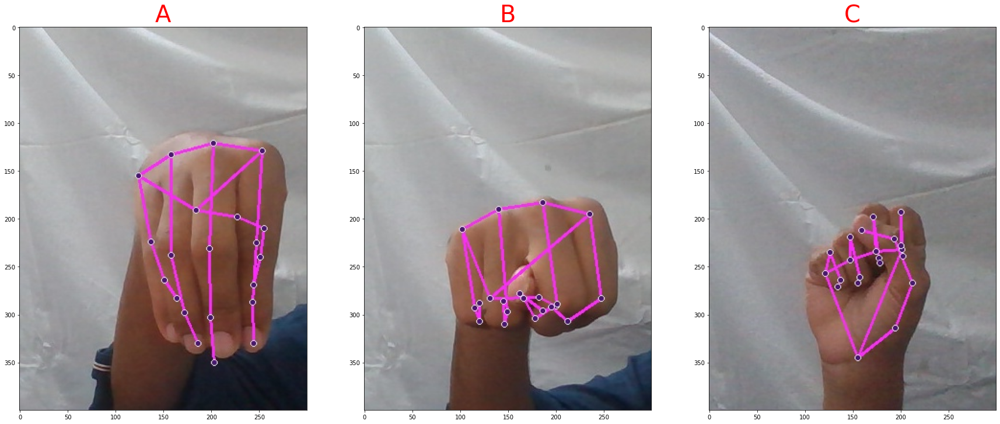

In [50]:
images = []
for img_path in glob.glob('images/*.jpg'):
    images.append(mpimg.imread(img_path))
    


plt.figure(figsize=(30,30))
columns = 3
for i, image in enumerate(images):
    #plt.text(60, 20,i,color='blue',fontsize=10,bbox=dict(facecolor='white',alpha=0.8))
    plt.subplot(len(images) / columns + 1, columns, i + 1)
    plt.title(class_names[i],fontsize=40,color="red")
    plt.imshow(image)

### 5.3.3 : CNN model 

In [74]:
# Generating batches of tensor image data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    )
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

val_generator = val_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

Found 5513 images belonging to 3 classes.
Found 1109 images belonging to 3 classes.


In [75]:
model = models.Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(5,5), activation='relu', input_shape=(150, 150, 3)))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPool2D(pool_size=(2, 2)))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(rate=0.5))
model.add(layers.Dense(3, activation='softmax'))

In [76]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 146, 146, 32)      2432      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 73, 73, 32)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 71, 71, 64)        18496     
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 35, 35, 64)        0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 35, 35, 64)        0         
_________________________________________________________________
flatten_5 (Flatten)          (None, 78400)             0         
_________________________________________________________________
dense_10 (Dense)             (None, 256)              

In [77]:

model.compile(
    loss='categorical_crossentropy', 
    optimizer='adam',
    metrics=['accuracy']  
)

### 5.3.4 : Training

In [78]:
history = model.fit(
      train_generator,
      steps_per_epoch=50, 
      epochs=5,
      validation_data=val_generator,
      validation_steps=33) 

Epoch 1/5
50/50 [==============================] - 23s 443ms/step - loss: 0.8838 - accuracy: 0.7380 - val_loss: 0.0869 - val_accuracy: 0.9712
Epoch 2/5
50/50 [==============================] - 19s 376ms/step - loss: 0.1055 - accuracy: 0.9610 - val_loss: 0.0448 - val_accuracy: 0.9788
Epoch 3/5
50/50 [==============================] - 18s 357ms/step - loss: 0.0374 - accuracy: 0.9860 - val_loss: 0.0321 - val_accuracy: 0.9848
Epoch 4/5
50/50 [==============================] - 18s 356ms/step - loss: 0.0271 - accuracy: 0.9900 - val_loss: 0.0217 - val_accuracy: 0.9894
Epoch 5/5
50/50 [==============================] - 17s 340ms/step - loss: 0.0276 - accuracy: 0.9879 - val_loss: 0.0206 - val_accuracy: 0.9909


### 5.3.5 : Model performance graph

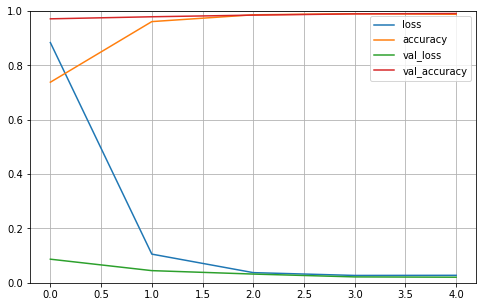

In [79]:
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

### 5.3.6 : Saving the model

In [80]:
model.save("model_smn.h5")

### 5.3.7 : Loading the saved model

In [81]:
model_smn = tf.keras.models.load_model("model_smn.h5")

### 5.3.8 : Testing the model

In [82]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='categorical')

model_smn.evaluate(test_generator, steps=9)

Found 1109 images belonging to 3 classes.
9/9 [==============================] - 2s 174ms/step - loss: 0.0182 - accuracy: 0.9944


[0.018244216218590736, 0.9944444298744202]